# Classification of song based on audio features
Author: DZIKI Yanis

In [2]:
import pandas as pd
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 

We will work with a dataset that contains audio features of songs, the goal is to classify the songs based on these features. We will use a Random Forest Classifier to classify the songs.

The dataset contains the following columns:
- track_id : the id of the track
- track_name : the name of the track
- track_artist : the artist of the track
- lyrics : the lyrics of the track 
- track_popularity : the popularity of the track
- track_album_id : the id of the album of the track
- track_album_name : the name of the album of the track
- track_album_release_date : the release date of the album of the track
- playlist_name : the name of the playlist
- playlist_id : the id of the playlist
- playlist_genre : the genre of the playlist
- playlist_subgenre : the subgenre of the playlist
- Audio features : 
    - danceability : Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.


    - energy : Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.
    - key : The key the track is in. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.
    - loudness : The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.
    - mode : Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.
    - speechiness : Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.
    - acousticness : A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.
    - instrumentalness : Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.
    - liveness : Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.
    - valence : A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).
    - tempo : The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.
    - duration_ms : The duration of the track in milliseconds.
    - language : The language of the track




Of course we will not use the lyrics of the songs to classify them, we will only use the audio features.
So for the preprocessing we will drop the columns that are not useful for the classification, and we will encode the categorical columns.


In [3]:
# Open the data

def open_data(data):
    df = pd.read_csv(data)
    df_clean = df.copy()
    df_clean.columns = [x.strip() for x in df_clean.columns]
    df_clean = df_clean.set_index(['track_name', 'track_artist'])
    df_clean = df_clean.drop(['lyrics','track_id', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre', 'language'], axis=1)
    df_clean = df_clean.dropna() # Drop NaN values
    return df_clean

open_data('data/spotify_songs.csv')



,,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
track_name,track_artist,,,,,,,,,,,,,
Pangarap,Barbie's Cradle,41,0.682,0.401,2,-10.068,1,0.0236,0.27900,0.011700,0.0887,0.566,97.091,235440
I Feel Alive,Steady Rollin,28,0.303,0.880,9,-4.739,1,0.0442,0.01170,0.009940,0.3470,0.404,135.225,373512
Poison,Bell Biv DeVoe,0,0.845,0.652,6,-7.504,0,0.2160,0.00432,0.007230,0.4890,0.650,111.904,262467
Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,41,0.425,0.378,5,-5.819,0,0.0341,0.68900,0.000000,0.0664,0.405,118.593,243067
Dumb Litty,KARD,65,0.760,0.887,9,-1.993,1,0.0409,0.03700,0.000000,0.1380,0.240,130.018,193160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rising Like The Sun - Radio Mix,Qulinez,0,0.479,0.800,10,-5.778,0,0.0878,0.00555,0.000000,0.3350,0.211,128.012,208656
Anaconda,Nicki Minaj,49,0.963,0.603,2,-6.224,1,0.1800,0.06730,0.000006,0.2140,0.647,129.990,260240
Bound,Ponderosa Twins Plus One,40,0.458,0.540,5,-6.457,0,0.0270,0.71500,0.000428,0.1150,0.657,142.218,191205


In [4]:
df_clean = open_data('data/spotify_songs.csv')
df_clean.head()
df_clean.info()


<class 'pandas.core.frame.DataFrame'>
MultiIndex: 18454 entries, ('Pangarap', "Barbie's Cradle") to ('Migraine', 'Moonstar88')
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_popularity  18454 non-null  int64  
 1   danceability      18454 non-null  float64
 2   energy            18454 non-null  float64
 3   key               18454 non-null  int64  
 4   loudness          18454 non-null  float64
 5   mode              18454 non-null  int64  
 6   speechiness       18454 non-null  float64
 7   acousticness      18454 non-null  float64
 8   instrumentalness  18454 non-null  float64
 9   liveness          18454 non-null  float64
 10  valence           18454 non-null  float64
 11  tempo             18454 non-null  float64
 12  duration_ms       18454 non-null  int64  
dtypes: float64(9), int64(4)
memory usage: 2.7+ MB


### Data Preprocessing

We need to normalize the data since the features have different scales, we will use the MinMaxScaler to normalize the data.

In [5]:
def scale_data(df):
    scaler = MinMaxScaler()
    scaler.fit(df)
    df_scaled = scaler.transform(df)
    df_scaled = pd.DataFrame(df_scaled, columns=df.columns, index=df.index)
    return df_scaled


In [6]:
minmax_df = scale_data(df_clean)
minmax_df

,,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
track_name,track_artist,,,,,,,,,,,,,
Pangarap,Barbie's Cradle,0.41,0.662692,0.390827,0.181818,0.681000,1.0,0.001340,0.281249,0.011854,0.080414,0.571136,0.338981,0.418893
I Feel Alive,Steady Rollin,0.28,0.232254,0.877962,0.818182,0.830868,1.0,0.024341,0.011793,0.010071,0.342212,0.407663,0.554509,0.703040
Poison,Bell Biv DeVoe,0.00,0.847814,0.646090,0.545455,0.753108,0.0,0.216168,0.004353,0.007325,0.486135,0.655900,0.422702,0.474513
Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,0.41,0.370812,0.367436,0.454545,0.800495,0.0,0.013064,0.694556,0.000000,0.057812,0.408672,0.460508,0.434589
Dumb Litty,KARD,0.65,0.751278,0.885081,0.818182,0.908094,1.0,0.020657,0.037297,0.000000,0.130382,0.242172,0.525080,0.331882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Rising Like The Sun - Radio Mix,Qulinez,0.00,0.432141,0.796603,0.909091,0.801648,0.0,0.073024,0.005593,0.000000,0.330049,0.212908,0.513742,0.363772
Anaconda,Nicki Minaj,0.49,0.981829,0.596258,0.181818,0.789105,1.0,0.175971,0.067841,0.000006,0.207411,0.652872,0.524922,0.469930
Bound,Ponderosa Twins Plus One,0.40,0.408291,0.532188,0.454545,0.782552,0.0,0.005136,0.720766,0.000434,0.107070,0.662963,0.594033,0.327858


We can now try to display the distribution of the songs based on each feature to see how our dataset is composed.


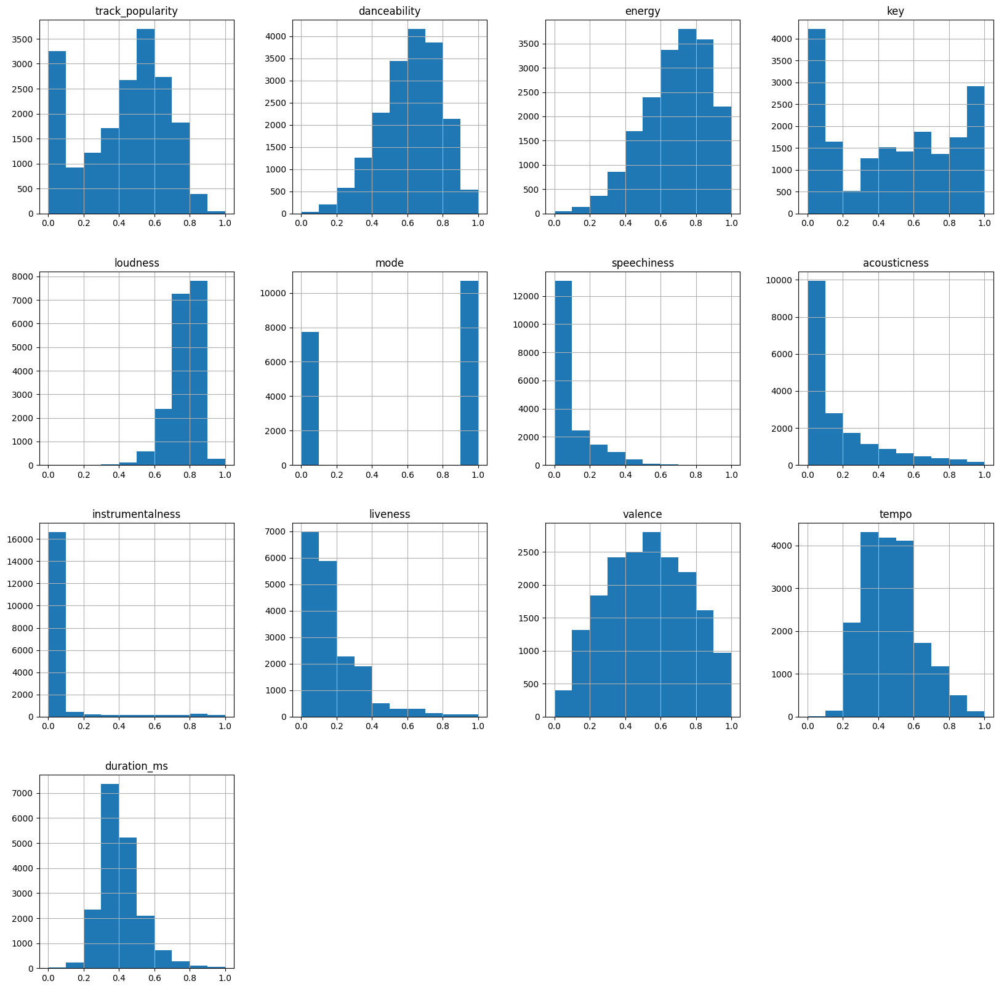

In [32]:
minmax_df.hist(figsize=(20, 20), bins=10)
plt.show()

In [7]:
# We split the data 70% for training and 30% for testing
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(minmax_df, test_size=0.3, random_state=42)


### Decision Tree Classifier

We will use a Decision Tree Classifier to classify the songs based on the audio features, we will use the accuracy score to evaluate the model.

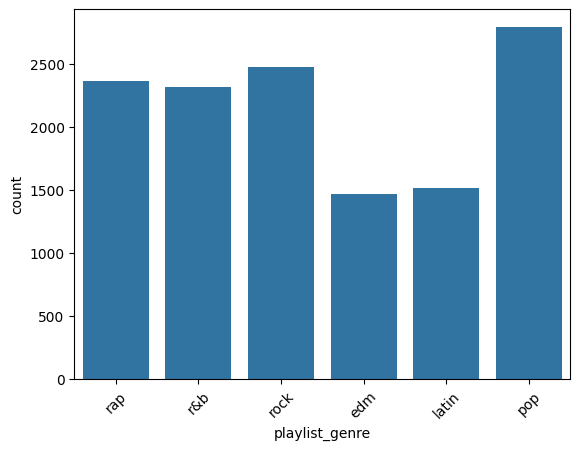

In [8]:
# We need a table with the playlist_genre 

df_genre = pd.read_csv('data/spotify_songs.csv')
df_genre.columns = [x.strip() for x in df_genre.columns]
df_genre = df_genre.set_index(['track_name', 'track_artist'])
df_genre = df_genre.drop_duplicates()
df_genre = df_genre[['playlist_genre']]

Y_train, Y_test = train_test_split(df_genre, test_size=0.3, random_state=42)

# Plot the number of songs per genre
sns.countplot(x='playlist_genre', data=Y_train)
plt.xticks(rotation=45)
plt.show()




In [10]:
from sklearn import tree

clf = tree.DecisionTreeClassifier(criterion='entropy')
clf = clf.fit(X_train, Y_train)



[Text(0.5, 0.9, 'x[6] <= 0.124\nentropy = 2.545\nsamples = 12917\nvalue = [1465, 1514, 2791, 2312, 2363, 2472]'),
 Text(0.25, 0.7, 'x[1] <= 0.585\nentropy = 2.492\nsamples = 9848\nvalue = [1258, 1180, 2492, 1669, 912, 2337]'),
 Text(0.125, 0.5, 'x[2] <= 0.632\nentropy = 2.191\nsamples = 4281\nvalue = [550, 225, 1033, 535, 177, 1761]'),
 Text(0.0625, 0.3, 'x[4] <= 0.711\nentropy = 2.147\nsamples = 1375\nvalue = [41, 108, 298, 405, 53, 470]'),
 Text(0.03125, 0.1, '\n  (...)  \n'),
 Text(0.09375, 0.1, '\n  (...)  \n'),
 Text(0.1875, 0.3, 'x[10] <= 0.362\nentropy = 2.043\nsamples = 2906\nvalue = [509, 117, 735, 130, 124, 1291]'),
 Text(0.15625, 0.1, '\n  (...)  \n'),
 Text(0.21875, 0.1, '\n  (...)  \n'),
 Text(0.375, 0.5, 'x[4] <= 0.768\nentropy = 2.513\nsamples = 5567\nvalue = [708, 955, 1459, 1134, 735, 576]'),
 Text(0.3125, 0.3, 'x[6] <= 0.029\nentropy = 2.41\nsamples = 2170\nvalue = [123, 264, 459, 681, 253, 390]'),
 Text(0.28125, 0.1, '\n  (...)  \n'),
 Text(0.34375, 0.1, '\n  (...)  

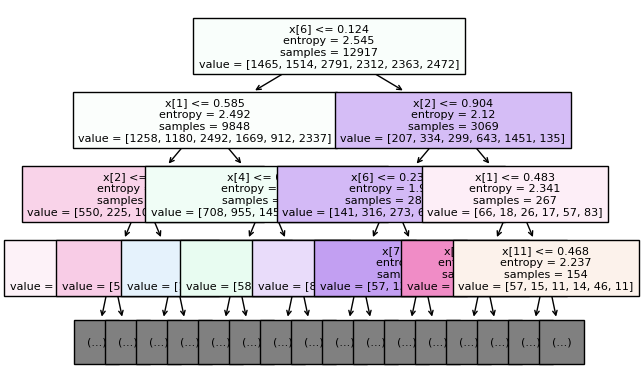

In [11]:
tree.plot_tree(clf, max_depth=3, filled=True, fontsize=8)


In [12]:
clf.score(X_train, Y_train)

0.9997677479290857

In [13]:
predY = clf.predict(X_test)
predictions = pd.DataFrame(predY, columns=['playlist_genre_predicted'], index=Y_test.index)


predictions['playlist_genre'] = Y_test['playlist_genre']
predictions


,,playlist_genre_predicted,playlist_genre
track_name,track_artist,,
No Beef,Afrojack,edm,edm
Head In The Clouds,88rising,pop,r&b
Goliath,Dyro,edm,edm
Savin' Me,Nickelback,pop,rock
Down,blink-182,edm,pop
...,...,...,...
Eres,Café Tacvba,pop,rock
Uncle Albert/Admiral Halsey,Paul McCartney,rock,rock
Legends Never Die (feat. Against the Current),League of Legends,pop,edm


In [14]:
from sklearn.metrics import accuracy_score
accuracy_score(Y_test, predY)



0.42297272891457466

This result is not the best we can get,(even if it is still a decent number given the complexity of the task), we can try to use a Random Forest Classifier to improve the accuracy of the model.

In [15]:
# Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=0)
clf.fit(X_train, Y_train)

clf.score(X_train, Y_train)

predY = clf.predict(X_test)
predictions = pd.DataFrame(predY, columns=['playlist_genre_predicted'], index=Y_test.index)
predictions['playlist_genre'] = Y_test['playlist_genre']
predictions

accuracy_score(Y_test, predY)


/home/yanis/.local/lib/python3.10/site-packages/sklearn/base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


0.5670940942748781

It is a pretty decent result given the fact that there were 5 genres. 

## Clustering

We can also try to cluster the songs based on the audio features, we will use the KMeans algorithm to cluster the songs.


The number of clusters is a hyperparameter that we need to tune, we will use the Elbow method to find the optimal number of clusters.

We can now try to visualize the clusters using the PCA algorithm to reduce the dimensionality of the data.


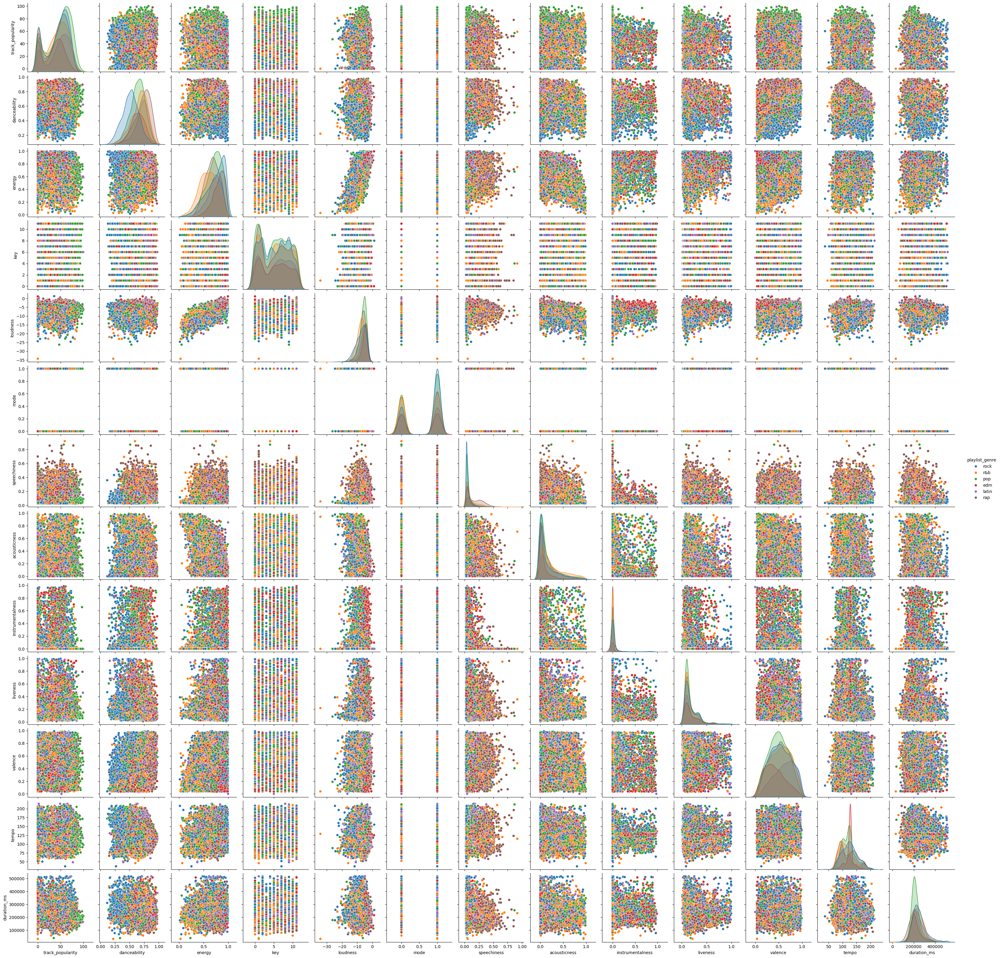

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

data = pd.read_csv('data/spotify_songs.csv')
data.columns = [x.strip() for x in data.columns]
data = data.set_index(['track_name', 'track_artist'])


data = data.dropna()

data = data.drop(['track_id', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_subgenre', 'language'], axis=1)

sns.pairplot(data, hue='playlist_genre')


/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1

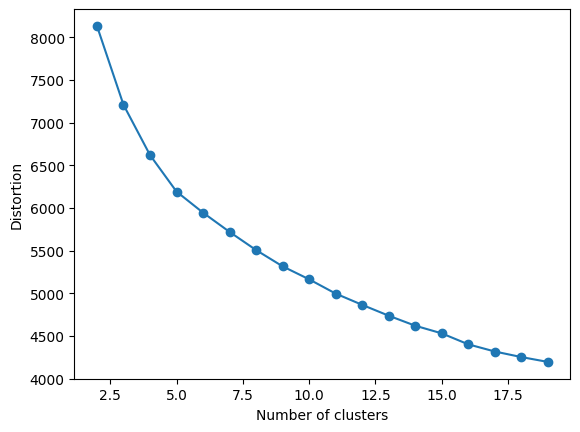

In [18]:
# Elbow method

from sklearn.cluster import KMeans

def elbow_method(data, k):
    distortions = []
    for i in range(2, k):
        kmeans = KMeans(n_clusters=i, random_state=0).fit(data)
        distortions.append(kmeans.inertia_)
    return distortions

distortions = elbow_method(minmax_df, 20)

plt.plot(range(2, 20), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()



/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


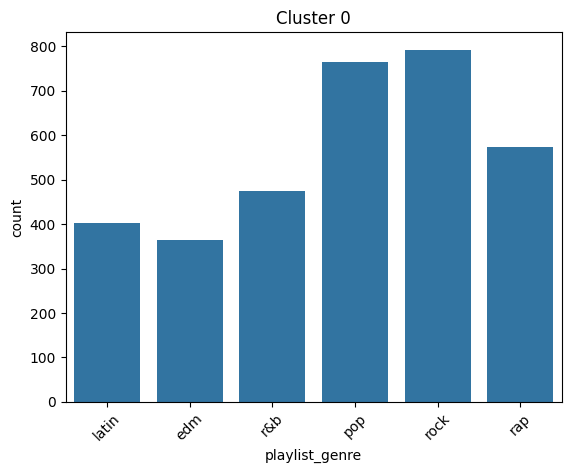

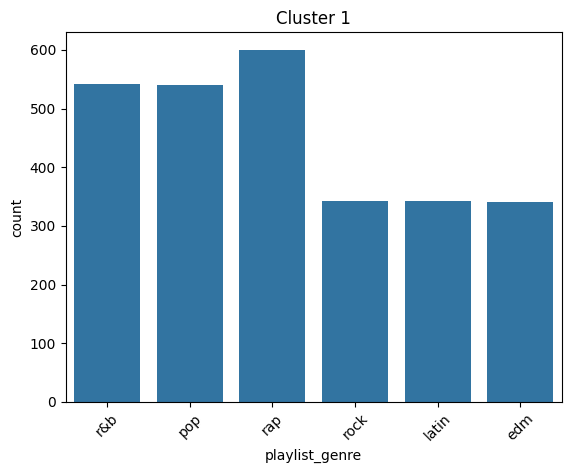

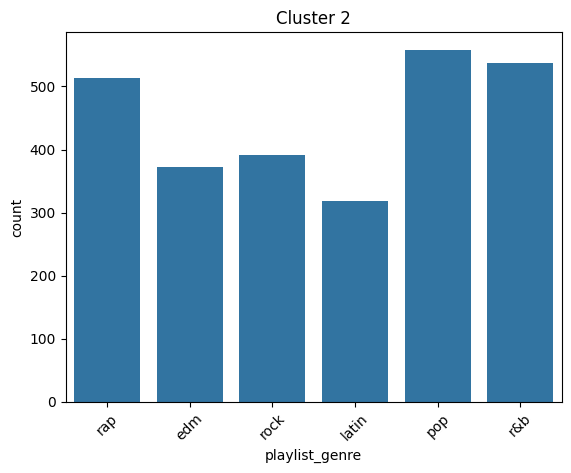

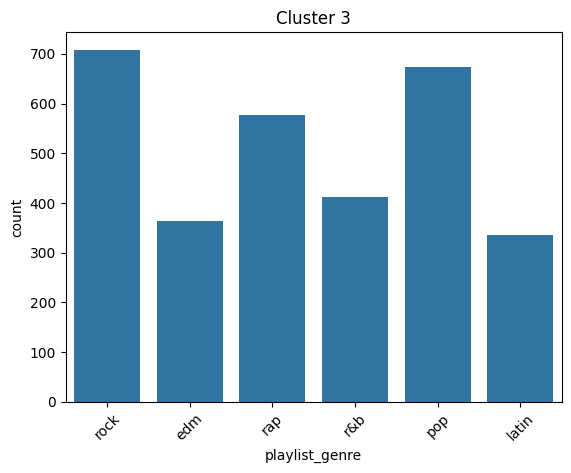

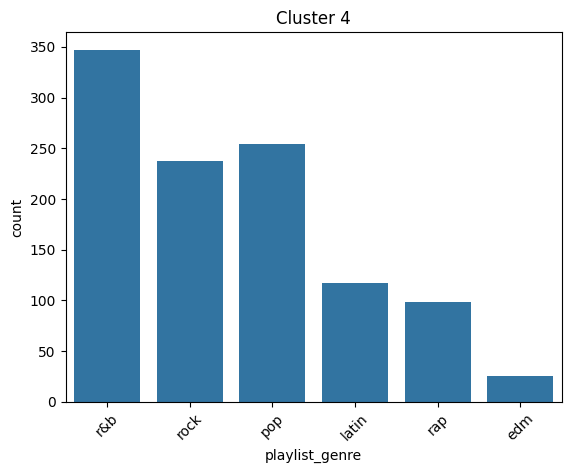

In [69]:
# KMeans with 15 clusters
df_to_cluster= X_train.copy()
kmeans = KMeans(n_clusters=5, random_state=0).fit(df_to_cluster)
df_to_cluster['cluster'] = kmeans.labels_
df_to_cluster
df_to_cluster.set_index([X_train.index, 'cluster'], inplace=True)



Y_train, Y_test = train_test_split(df_genre, test_size=0.3, random_state=42)



Y_train['cluster'] = kmeans.labels_
Y_train



# Make a plot for each cluster with the number of songs per genre
for i in range(5):
    sns.countplot(x='playlist_genre', data=Y_train[Y_train['cluster'] == i])
    plt.title(f'Cluster {i}')
    plt.xticks(rotation=45)
    plt.show()


We can see that the clustering does not work well, (due to the curse of dimensionality), however, we can try to drop some features to reduce the dimensionality of the data and see if the clustering works better. 

In [22]:
df_drop= pd.read_csv('data/spotify_songs.csv')
df_drop.columns = [x.strip() for x in df_drop.columns]
df_drop = df_drop.set_index(['track_name', 'track_artist'])
df_drop = df_drop.drop_duplicates()
df_drop.drop(['lyrics','track_id', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'language'], axis=1, inplace=True)
df_drop.drop(['key', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence','duration_ms','track_popularity','loudness'], axis=1, inplace=True)
# Delete outliers (which have at least one zero value)
df_drop = df_drop[(df_drop.T != 0).all()]
df_drop = df_drop.dropna()


df_drop_genre = df_drop.copy()
df_drop.drop(['playlist_genre','playlist_subgenre'], axis=1, inplace=True)




df_drop_genre = df_drop_genre[['playlist_genre']]




#X_train, X_test = train_test_split(df_drop, test_size=0.3, random_state=0)
#Y_train, Y_test = train_test_split(df_drop_genre, test_size=0.3, random_state=0)




df_drop





,,danceability,energy,tempo
track_name,track_artist,,,
Pangarap,Barbie's Cradle,0.682,0.401,97.091
I Feel Alive,Steady Rollin,0.303,0.880,135.225
Poison,Bell Biv DeVoe,0.845,0.652,111.904
Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,0.425,0.378,118.593
Dumb Litty,KARD,0.760,0.887,130.018
...,...,...,...,...
Rising Like The Sun - Radio Mix,Qulinez,0.479,0.800,128.012
Anaconda,Nicki Minaj,0.963,0.603,129.990
Bound,Ponderosa Twins Plus One,0.458,0.540,142.218


/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1

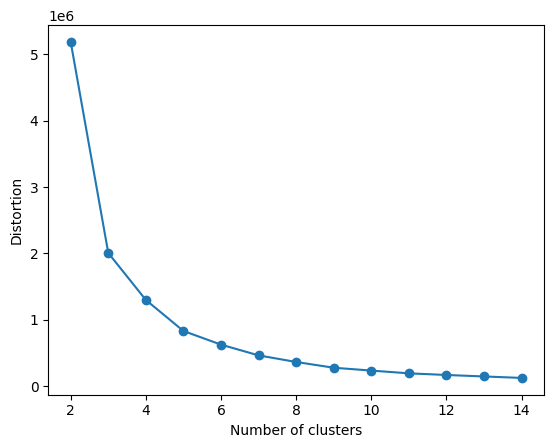

In [23]:
# Elbow method
distortions = elbow_method(df_drop, 15)

plt.plot(range(2, 15), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()




Here we can see that the elbow method works better and that we could obtain a better clustering with 5 clusters 

/home/yanis/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


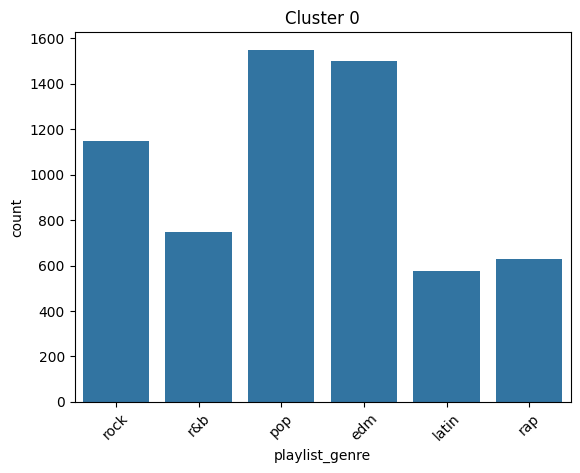

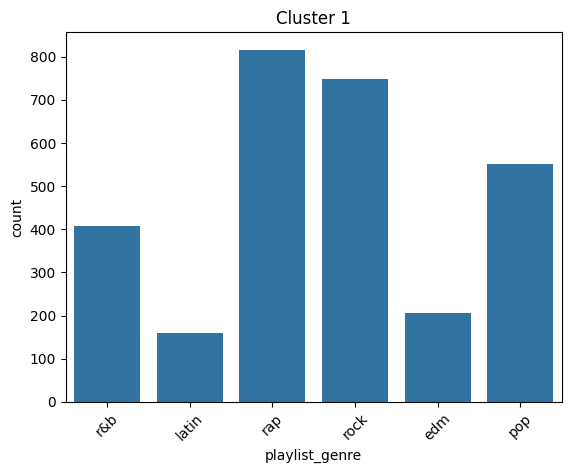

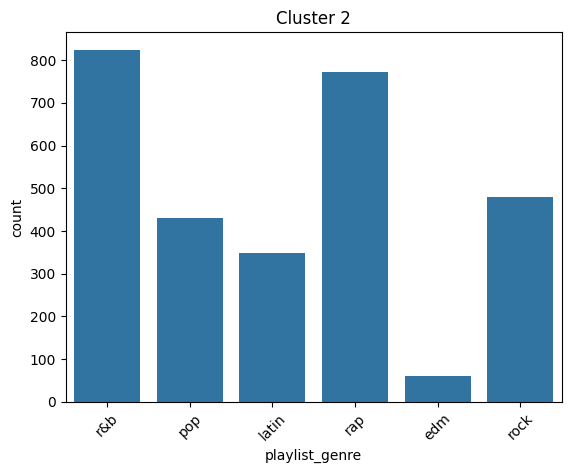

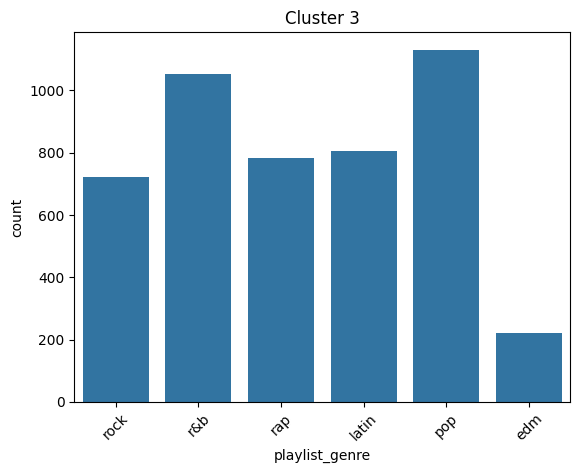

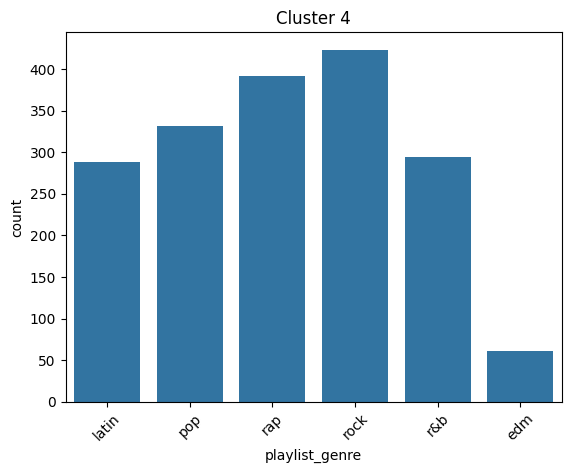

In [27]:
kmeans = KMeans(n_clusters=5, random_state=42).fit(df_drop)

df_drop['cluster'] = kmeans.labels_

df_drop_genre['cluster'] = kmeans.labels_
df_drop_genre
for i in range(5):
    sns.countplot(x='playlist_genre', data=df_drop_genre[df_drop_genre['cluster'] == i])
    plt.title(f'Cluster {i}')
    plt.xticks(rotation=45)
    plt.show()
    

We can see that the clustering works better than previously especially for some specific kind of songs (edm/latin). However, it is clear that the clusters does not reflect the genre. 
We can try to display in 2D pairwise the repartition of the clusters. 


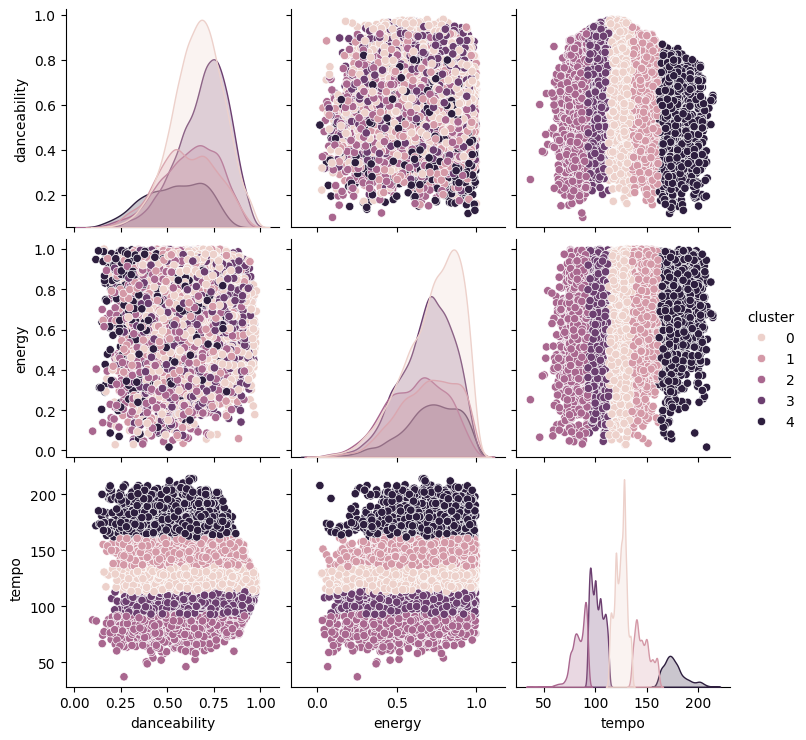

In [28]:



sns.pairplot(df_drop, hue='cluster')


We can notice that the clusters were mostly based on the tempo range of the songs 

As a conclusion, one can say that Kmeans clustering might not be the best approach to try to determine the genre of a song based on its features, it can be explained by the fact that audio features are continous and thus songs are not easily separable in clusters based on these features.